### Segmentez des clients d'un site e-commerce - Essais

### Sommaire


* [1. Importation des librairies, définition des fonctions et importation du fichier](#1)
    * [1.1 Importation des librairies](#1_1)
    * [1.2 Fonctions](#1_2)
    * [1.3 Importation du fichier](#1_3)
* [2. KMeans avec les données RFM](#2)
    * [2.1 Recherche du nombre optimal de clusters](#2_1)
    * [2.2 Entraînement du KMeans](#2_2)
    * [2.3 Interprétation des clusters](#2_3)
* [3. Classification ascendante hierarchique (CAH) avec les données RFM](#3)
    * [3.1 Construction de la matrice des distances](#3_1)
    * [3.2 Construction du dendrogramme et recherche du nombre optimal de clusters](#3_2)
    * [3.3 Entraînement de la CAH](#3_3)
    * [3.4 Interprétation des clusters](#3_4)
* [4. DBSCAN (Density-Based Spatial Clustering of Applications with Noise) avec les données RFM](#4)
    * [4.1 Recherche du nombre optimal de clusters](#4_1)
    * [4.2 Entraînement du DBSCAN](#4_2)
    * [4.3 Interprétation des clusters](#4_3)
* [5. KMeans avec les données RFM + 'Mean_review_score'](#5)
    * [5.1 Recherche du nombre optimal de clusters](#5_1)
    * [5.2 Entraînement du KMeans](#5_2)
    * [5.3 Interprétation des clusters](#5_3)
* [6. Conclusion et choix de l'algorithme](#6)

## 1. Importation des librairies, définition des fonctions et importation du fichier <a class="anchor" id="1"></a>

### 1.1 Importation des librairies <a class="anchor" id="1_1"></a>

In [1]:
# Data
import pandas as pd
import numpy as np

# Graphiques
import matplotlib.pyplot as plt
import seaborn as sns
# Visualisation 3D
import plotly.offline as py
import plotly.graph_objs as go
# Pour le graphique en radar
from math import pi

# Scaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Pour la CAH
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Pour les scores
from sklearn.metrics import silhouette_score, davies_bouldin_score

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

### 1.2 Fonctions <a class="anchor" id="1_2"></a>

In [2]:
def num_clusters_kmeans(df):
    """Choix du nombre optimal de clusters (méthode du coude et du score de silhouette) pour KMeans"""
    inertias = []
    silhouettes =[]
    davies = []
    K = range(2, 10)

    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=42)
        kmeanModel.fit(df)
        inertias.append(kmeanModel.inertia_)
        silhouettes.append(silhouette_score(df, kmeanModel.labels_))
        davies.append(davies_bouldin_score(df, kmeanModel.labels_))

    # Rajouter les données dans un Dataframe
    df_resultats_KMeans = pd.DataFrame({
        'Type': 'KMeans',
        'n_clusters': K,
        'Silhouette': silhouettes,
        'Davies_Bouldin' : davies
    })

    # Trier dans l'ordre décroissant des score de silhouette
    df_resultats_KMeans = df_resultats_KMeans.sort_values(by='Silhouette', ascending=False)

    # Tracer la courbe de l'inertie en fonction du nombre de clusters
    plt.figure()
    plt.plot(K, inertias)
    plt.xlabel('Nombre de clusters')
    plt.ylabel('Inertie')
    plt.title('Méthode du coude')

    # Graphique du score de silhouette
    plt.figure()
    plt.plot(K, silhouettes, marker='o')
    plt.xlabel('k')
    plt.ylabel('Score de silhouette')
    plt.title('Le score de silhouette montrant le k optimal')

    # Graphique du score de Davies Bouldin
    plt.figure()
    plt.plot(K, davies, marker='o')
    plt.xlabel('k')
    plt.ylabel('Indice de Davies-Bouldin')
    plt.title("L'indice de Davies-Bouldin montrant le k optimal")

    plt.tight_layout()
    plt.show()
    return df_resultats_KMeans

def box_plot(df_columns, df_clusters, x):
    """Créer un boxplot pour chaque colonne"""
    num_cols = len(df_columns.columns)

    # Nombre de lignes pour les sous-graphiques
    num_rows = num_cols // 2
    if num_cols % 2:
        num_rows = num_rows+1

    plt.figure(figsize=(10, 4 * num_rows))
    for i, column in enumerate(df_columns.columns, start=1):
        plt.subplot(num_rows, 2, i)
        sns.boxplot(x=x, y=column, data=df_clusters, palette='magma')
        plt.title(column)
    
    plt.tight_layout()
    plt.show()

def radar_plot(df_centroïds, df_columns):
    """Faire un radar plot pour chacun des clusters"""
    # Normalisation des centroïdes pour que toutes les valeurs soient entre 0 et 1
    centroïds_normalized = MinMaxScaler().fit_transform(df_centroïds)

    # Nombre de colonnes
    num_cols = len(df_columns.columns)

    # Nombre de clusters
    n_clusters = len(df_centroïds.index)

    # Nombre de lignes pour les sous-graphiques
    num_rows = n_clusters // 2
    if n_clusters % 2:
        num_rows = num_rows+1

    # Noms des clusters
    cluster_label = df_centroïds.index.to_list()

    # Création du radar plot
    angles = np.linspace(0, 2 * np.pi, num_cols, endpoint=False)
    angles = np.concatenate((angles, [angles[0]]))

    plt.figure(figsize=(10, 4 * num_rows))
    for cluster_label, cluster in enumerate(df_centroïds.index):
        plt.subplot(num_rows, 2, cluster_label + 1, polar=True)
        # Sélection des valeurs des caractéristiques pour le cluster
        cluster_index = df_centroïds.index[cluster_label]
        values = centroïds_normalized[cluster_label, :]
        values = np.concatenate((values, [values[0]]))

        # Tracé du radar plot pour le cluster
        plt.plot(angles, values, linewidth=2, label=f'Cluster {cluster_label + 1}')
        plt.fill(angles, values, alpha=0.25)
        plt.xticks(angles[:-1], df_columns.columns, fontsize=8)
        plt.title(f'Caractéristiques du Cluster {cluster_label}', fontsize=12)

    plt.subplots_adjust(hspace=1)
    plt.tight_layout()
    plt.show()

def num_clusters_CAH(df, linkage_matrix):
    """Choix du nombre optimal de clusters pour CAH"""
    # Effectuer la CAH avec différentes coupes du dendrogramme
    n_clusters = range(2, 10)
    silhouette_scores = []
    davies = []

    for num_clusters in n_clusters:
        clusters = fcluster(linkage(df, method='ward', metric='euclidean'),
                            num_clusters,
                            criterion='maxclust')
        silhouette_avg = silhouette_score(df, clusters)
        silhouette_scores.append(silhouette_avg)
        davies.append(davies_bouldin_score(df, clusters))

    # Tracer le graphique du score de silhouette moyen pour chaque nombre de clusters
    plt.figure()
    plt.plot(n_clusters, silhouette_scores, marker='o')
    plt.title('Score de silhouette moyen pour chaque nombre de clusters')
    plt.xlabel('Nombre de clusters')
    plt.ylabel('Score de silhouette moyen')
    plt.show()

    # Tracer le graphique de l'indice de Davies-Bouldin pour chaque nombre de clusters
    plt.figure()
    plt.plot(n_clusters, davies, marker='o')
    plt.title('Indice de Davies-Bouldin pour chaque nombre de clusters')
    plt.xlabel('Nombre de clusters')
    plt.ylabel('Indice de Davies-Bouldin')
    plt.show()

    # Nouvelles lignes à rajouter dans le Dataframe df_resultats
    df_resultats_CAH = pd.DataFrame({
        'Type': 'CAH', 
        'n_clusters': n_clusters, 
        'Silhouette': silhouette_scores,
        'Davies_Bouldin' : davies
    })

    # Trier dans l'ordre décroissant des score de silhouette
    df_resultats_CAH = df_resultats_CAH.sort_values(by='Silhouette', ascending=False)

    return df_resultats_CAH

def num_clusters_DBSCAN(df):
    """Calculer les silhouettes scores pour élir le meilleur couple epsilon et MinPts"""
    # Créer une liste pour stocker les scores silhouette
    résultats = []

    # Tester différentes valeurs de min_samples et eps
    for min_samples in range(2, 6):
        for eps in [0.5, 1.0, 1.5]:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan.fit(df)
        
            # Ignorer les cas où tous les points sont dans le même cluster
            if len(set(dbscan.labels_)) > 1:
                résultats.append((min_samples, 
                                  eps, 
                                  silhouette_score(df, dbscan.labels_), 
                                  davies_bouldin_score(df, dbscan.labels_)))

    # Afficher les scores silhouette pour chaque combinaison dans l'ordre décroissant des scores de silhouette
    df_resultats_DBSCAN = pd.DataFrame(résultats, columns=['min_samples', 'eps', 'Silhouette', 'Davies_Bouldin'])
    df_resultats_DBSCAN = df_resultats_DBSCAN.sort_values(by='Silhouette', ascending=False)
    df_resultats_DBSCAN['Type'] = 'DBSCAN'
    return df_resultats_DBSCAN

### 1.3 Importation du fichier <a class="anchor" id="1_3"></a>

In [3]:
df_clustering = pd.read_csv('df_clustering.csv', index_col=0)
df_clustering.head()

,R_recence,F_frequence,M_montant,Mean_review_score
customer_unique_id,,,,
7c396fd4830fd04220f754e42b4e5bff,331,2,82.82,4.25
0f4389ffbcaa187a02a5ebeb0a2e616c,136,1,297.20,4.00
0f09cdca721fc27f3db141488a6ba143,35,1,80.31,5.00
0f687670823f779b76513fc03d33aab2,429,1,64.77,5.00
0036a074f98b80c4f1fc33dbbcf9c552,474,1,42.62,5.00


In [4]:
# Création d'un Dataframe avec seulement les données RFM
df_RFM = df_clustering[['R_recence', 'F_frequence', 'M_montant']]
df_RFM.head()

,R_recence,F_frequence,M_montant
customer_unique_id,,,
7c396fd4830fd04220f754e42b4e5bff,331,2,82.82
0f4389ffbcaa187a02a5ebeb0a2e616c,136,1,297.20
0f09cdca721fc27f3db141488a6ba143,35,1,80.31
0f687670823f779b76513fc03d33aab2,429,1,64.77
0036a074f98b80c4f1fc33dbbcf9c552,474,1,42.62


## 2. KMeans avec les données RFM <a class="anchor" id="2"></a>

### 2.1 Recherche du nombre optimal de clusters <a class="anchor" id="2_1"></a>

In [5]:
# Normaliser les données
scaler = StandardScaler()
df_normalized = scaler.fit_transform(df_RFM)

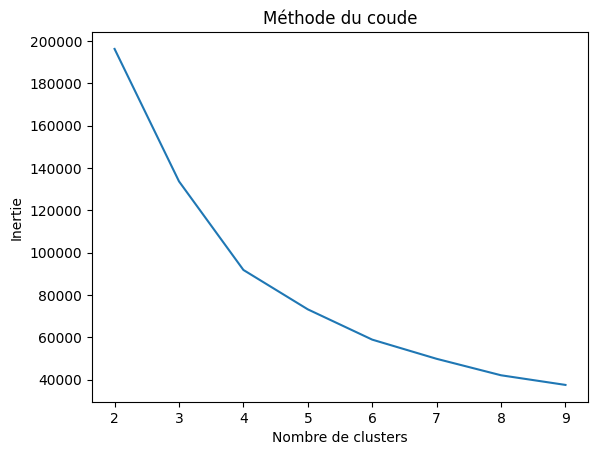

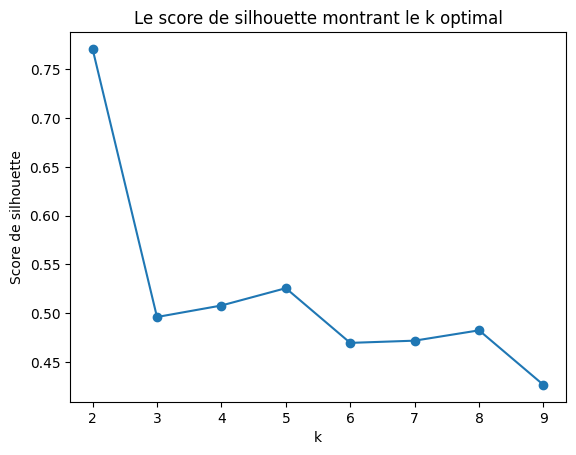

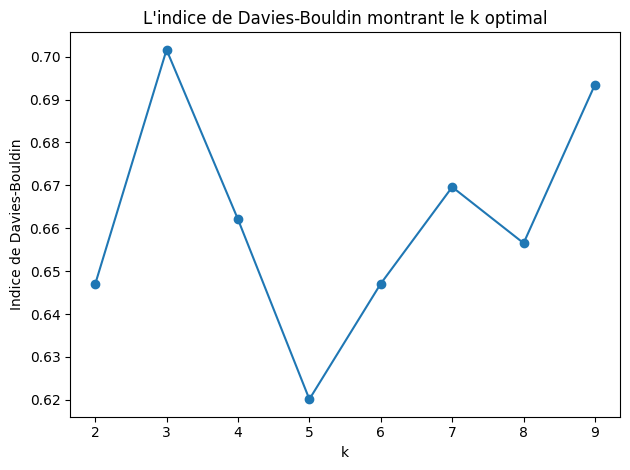

,Type,n_clusters,Silhouette,Davies_Bouldin
0,KMeans,2,0.771068,0.646928
3,KMeans,5,0.525578,0.620122
2,KMeans,4,0.507793,0.662084
1,KMeans,3,0.495990,0.701606
6,KMeans,8,0.482322,0.656523
5,KMeans,7,0.471715,0.669612
4,KMeans,6,0.469437,0.647081
7,KMeans,9,0.426303,0.693506


In [6]:
# Choix du nombre optimal de clusters (méthode du coude et du score de silhouette)
df_resultats_KMeans = num_clusters_kmeans(df_normalized)
df_resultats_KMeans

En utilisant la méthode du coude, nous constatons que le nombre idéal de clusters se situe entre 4 et 5. En se basant sur le score Silhouette, les options de 4 ou 5 clusters sont viables, et on peut ensuite voir que l'indice de Davies-Bouldin est minimisé pour 5 clusters.

Ainsi, la meilleure option serait de choisir 5 clusters.

### 2.2 Entraînement du KMeans <a class="anchor" id="2_2"></a>

In [7]:
# Choix du nombre de clusters
k = 5

# Garder les résultats optenus dans un Dataframe
df_resultats = df_resultats_KMeans.loc[df_resultats_KMeans['n_clusters'] == k]

# Appliquer KMeans avec le nombre de clusters optimal trouvé
kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
kmeans.fit(df_normalized)

KMeans(n_clusters=5, n_init=10, random_state=42)

In [8]:
# Attribuer les labels du KMeans aux clients
df_KMeans = df_RFM.copy()
df_KMeans['KMeans_label'] = kmeans.labels_
df_KMeans.head()

,R_recence,F_frequence,M_montant,KMeans_label
customer_unique_id,,,,
7c396fd4830fd04220f754e42b4e5bff,331,2,82.82,3
0f4389ffbcaa187a02a5ebeb0a2e616c,136,1,297.20,1
0f09cdca721fc27f3db141488a6ba143,35,1,80.31,1
0f687670823f779b76513fc03d33aab2,429,1,64.77,0
0036a074f98b80c4f1fc33dbbcf9c552,474,1,42.62,0


In [9]:
# Afficher le nombre de clients par clusters
df_count_KMeans = pd.DataFrame(df_KMeans['KMeans_label'].value_counts())
df_count_KMeans

,count
KMeans_label,
1,49700
0,36722
3,2661
2,2020
4,122


### 2.3 Interprétation des clusters <a class="anchor" id="2_3"></a>

In [10]:
# Afficher les centroïdes pour commencer à interpréter les clusters
centroïds_Kmeans_RFM = df_KMeans.groupby('KMeans_label')[df_RFM.columns].mean()
centroïds_Kmeans_RFM

,R_recence,F_frequence,M_montant
KMeans_label,,,
0,386.256522,1.000000,157.379171
1,126.370664,1.000000,156.304528
2,231.435644,1.010396,1714.466198
3,218.953777,2.110485,396.419410
4,228.565574,1.139344,8053.073033


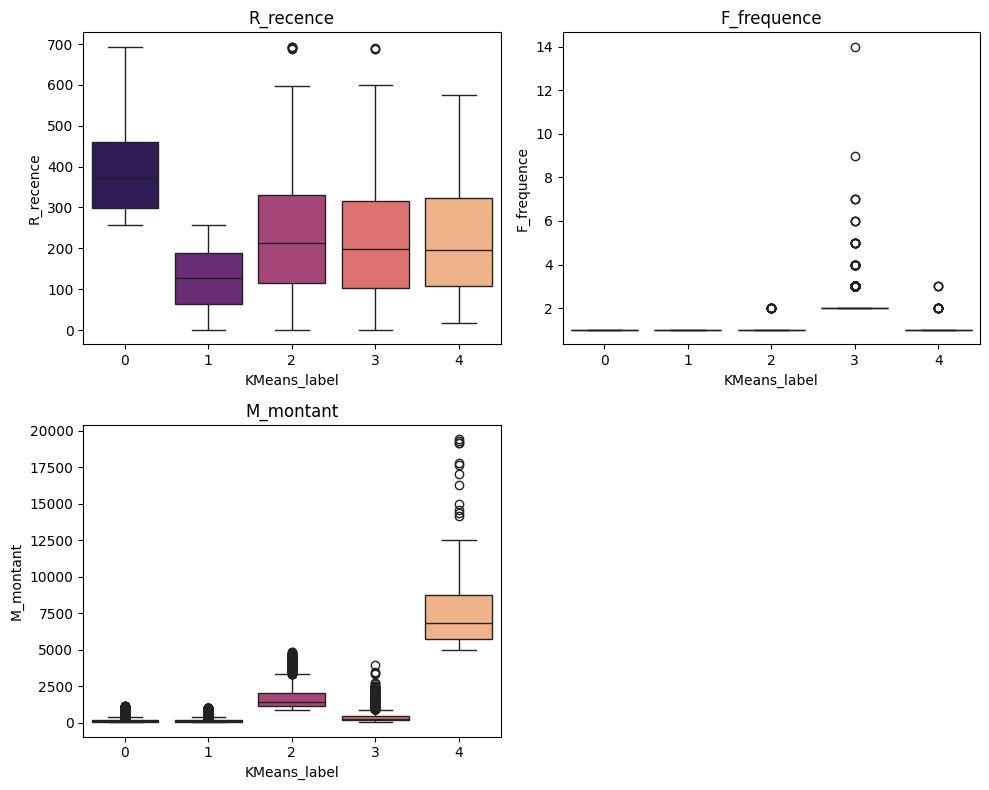

In [11]:
# Créer un boxplot pour chaque colonne
box_plot(df_RFM, df_KMeans, 'KMeans_label') 

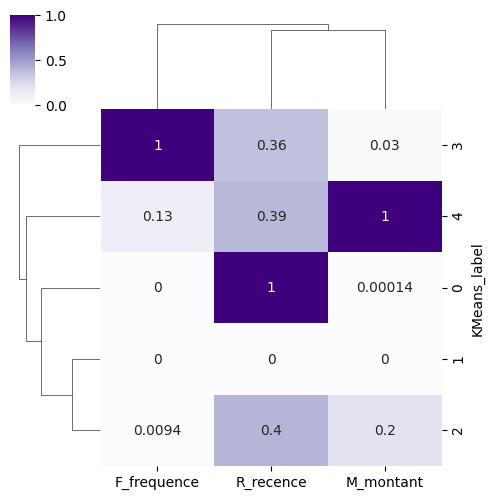

In [12]:
# Observons la répartitions de nos clusters avec une clustermap
sns.clustermap(centroïds_Kmeans_RFM, figsize=(5,5), annot=True, standard_scale=1, method='ward', cmap="Purples")

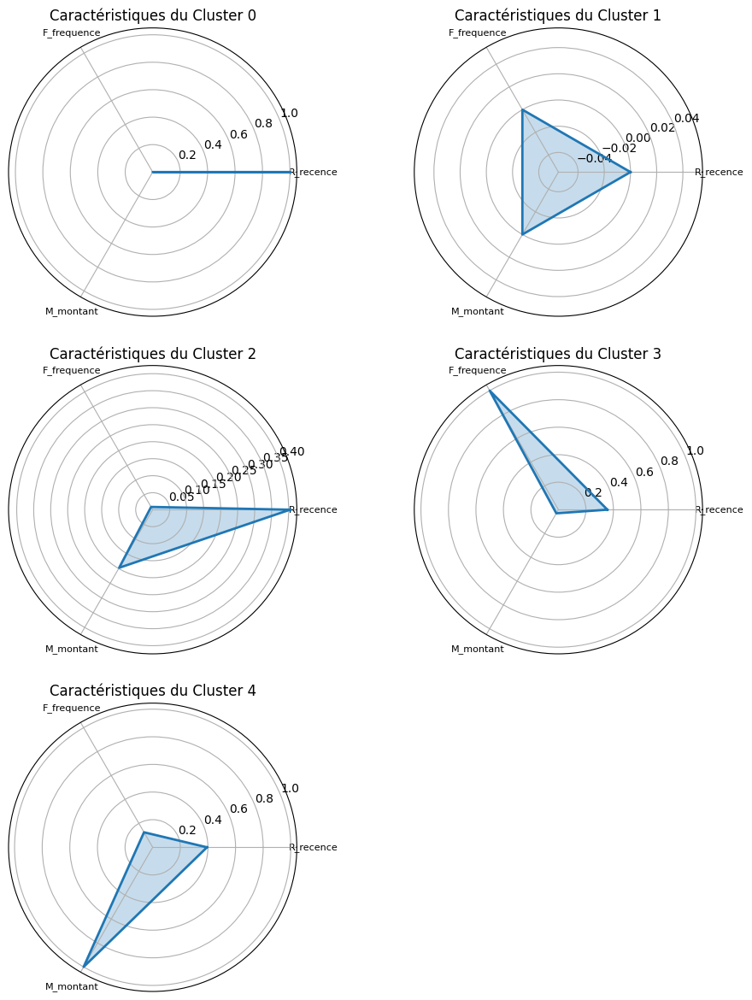

In [13]:
# Visualiser les clusters en radarplot
radar_plot(centroïds_Kmeans_RFM, df_RFM)

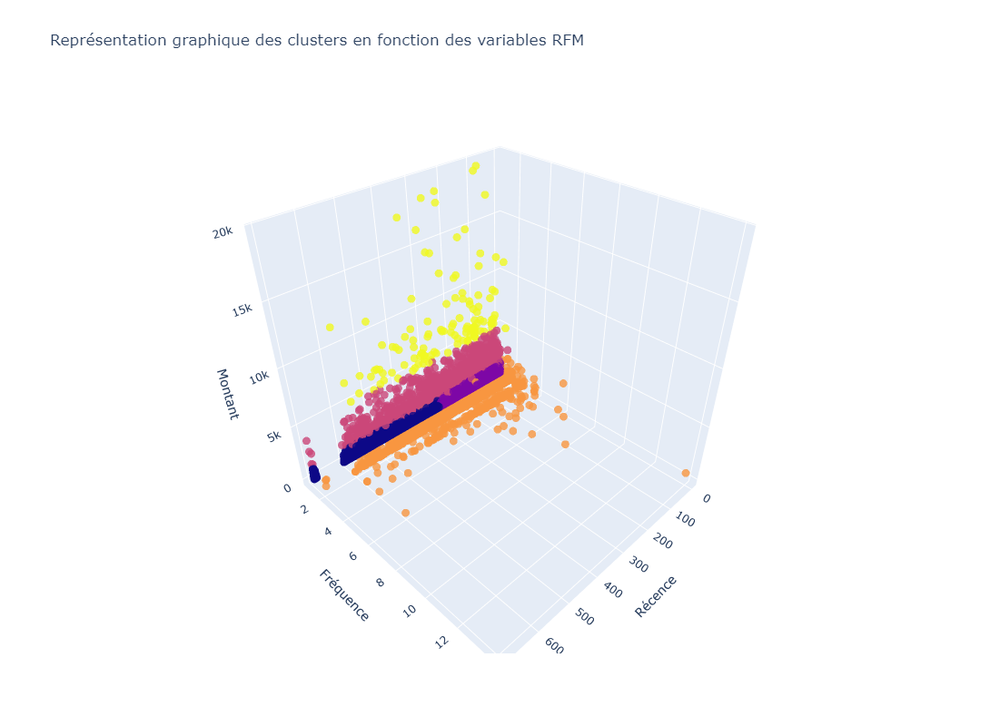

In [14]:
# Visualisation des groupes sur l'ensemble des données RFM
trace = go.Scatter3d(
    x=df_KMeans['R_recence'],
    y=df_KMeans['F_frequence'],
    z=df_KMeans['M_montant'],
    mode='markers',
    marker=dict(color=df_KMeans['KMeans_label'], size=5),
    line=dict(color=df_KMeans['KMeans_label'], width=16),
    opacity=0.8
)

data = [trace]
layout = go.Layout(
    title='Représentation graphique des clusters en fonction des variables RFM',
    scene=dict(
        xaxis=dict(title='Récence'),
        yaxis=dict(title='Fréquence'),
        zaxis=dict(title='Montant')
    ),
    width=1000,
    height=800
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

**Interprétation métier des clusters**
- Le **cluster 0** correspond aux *clients perdus*. Ils ont commandé une seule fois pour un montant modéré il y a 386 jours en moyenne. 
- Le **cluster 1** correspond aux derniers clients ayant commandé ; ils peuvent être assimilés à de *nouveaux clients* car c'était leur première commande. Il faut également noter que ces clients n'ont dépensé qu'un montant modéré.
- Le **cluster 2** correspond aux *clients ayant dépensé une somme importante sur le site* ; ces clients ont dépensés environ entre 1000 et 5000 sur le site, à noter que dans la majorité des cas ces clients n'ont commandé qu'une seule fois. 
- Le **cluster 3** correspond aux *clients fidèles* ; ces clients ont commandé au moins 2 fois sur le site.
- Le **cluster 4** correspond aux *clients ayant dépensé le plus sur le site* ; ces clients ont dépensé plus de 5000 sur le site, à noter que dans la majorité des cas ces clients n'ont commandé qu'une seule fois.

## 3. Classification ascendante hierarchique (CAH) avec les données RFM <a class="anchor" id="3"></a>

### 3.1 Construction de la matrice des distances <a class="anchor" id="3_1"></a>

In [15]:
# Le nombre de données est trop volumineux (cela donne une erreur de type 'MemoryError')
# Prennons un échantillon
échantillon = df_RFM.sample(n=45000, random_state=0)

# Normaliser les données
échantillon_normalized = scaler.fit_transform(échantillon)

# Calcul de la matrice de similarité/ dissimilarité
linkage_matrix = linkage(échantillon_normalized, method='ward', metric='euclidean')
linkage_matrix

array([[0.00000000e+00, 8.94300000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.12170000e+04, 2.87180000e+04, 0.00000000e+00, 2.00000000e+00],
       [5.81400000e+03, 2.39290000e+04, 0.00000000e+00, 2.00000000e+00],
       ...,
       [8.99920000e+04, 8.99950000e+04, 1.98007396e+02, 2.56140000e+04],
       [8.99940000e+04, 8.99960000e+04, 2.44616232e+02, 4.37010000e+04],
       [8.99930000e+04, 8.99970000e+04, 2.68416209e+02, 4.50000000e+04]])

### 3.2 Construction du dendrogramme et recherche du nombre optimal de clusters <a class="anchor" id="3_2"></a>

**Méthode du saut maximum** : Observer les distances verticales entre les fusions de clusters dans le dendrogramme.

**Rechercher les sauts les plus importants** et identifier le niveau de similarité/ dissimilarité correspondant. Le nombre de clusters peut être déterminé par le nombre de sauts significatifs dans le dendrogramme.

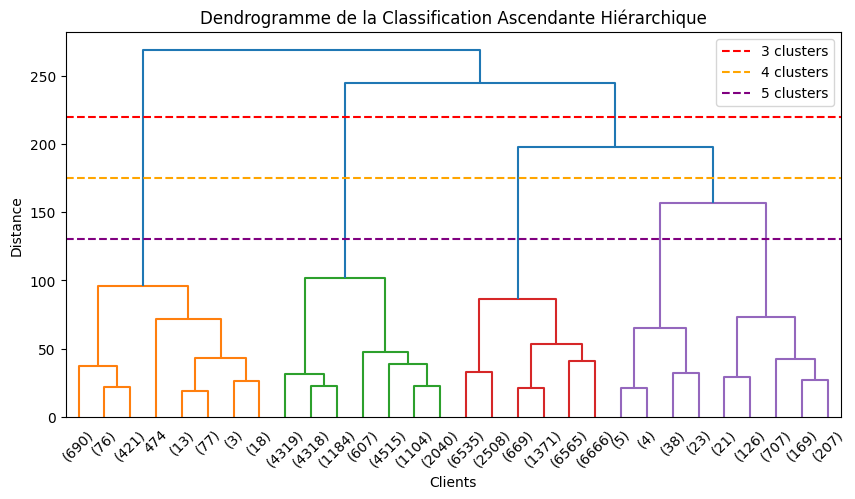

In [16]:
# Affichage du dendrogramme
plt.figure(figsize=(10,5))
dendrogram(linkage_matrix, truncate_mode="lastp")
plt.axhline(y=220, color='r', linestyle='--', label='3 clusters')
plt.axhline(y=175, color='orange', linestyle='--', label='4 clusters')
plt.axhline(y=130, color='Purple', linestyle='--', label='5 clusters')
plt.title('Dendrogramme de la Classification Ascendante Hiérarchique')
plt.xlabel('Clients')
plt.ylabel('Distance')
plt.legend()
plt.show()

Il est nécessaire de poursuivre l'analyse afin de déterminer le nombre optimal de clusters à utiliser. Dans ce contexte, l'utilisation de 3, 4 ou 5 clusters pourrait être envisagée.

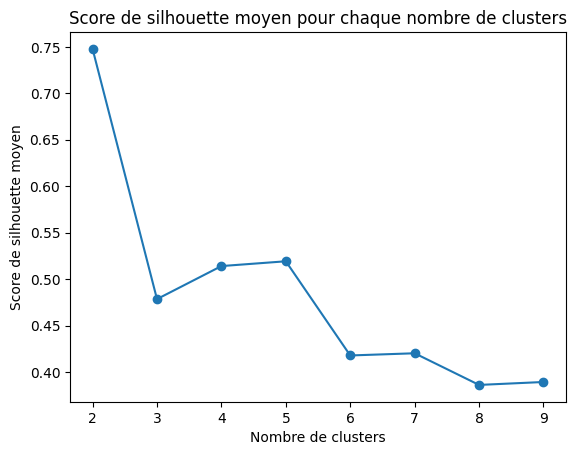

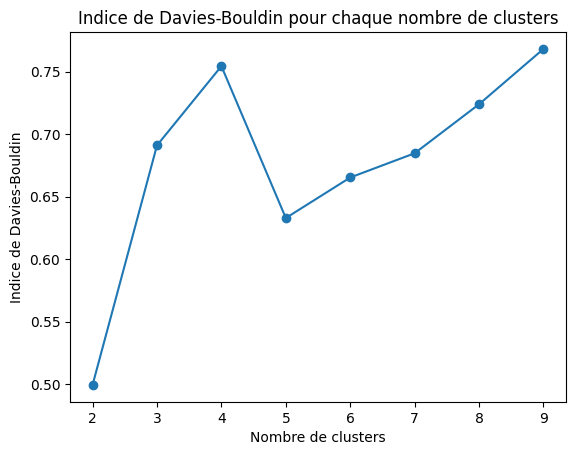

,Type,n_clusters,Silhouette,Davies_Bouldin
0,CAH,2,0.747728,0.499237
3,CAH,5,0.519143,0.632865
2,CAH,4,0.513991,0.754483
1,CAH,3,0.478432,0.691042
5,CAH,7,0.420129,0.684736
4,CAH,6,0.417765,0.665326
7,CAH,9,0.389212,0.768277
6,CAH,8,0.386060,0.723995


In [17]:
# Déterminer le nombre optimal de clusters pour la CAH
df_resultats_CAH = num_clusters_CAH(échantillon_normalized, linkage_matrix)
df_resultats_CAH

On optera donc pour 5 clusters, ce choix permettant de maximiser le score de Silhouette tout en minimisant l'indice de Davies-Bouldin.

### 3.3 Entraînement de la CAH <a class="anchor" id="3_3"></a>

In [18]:
# Choisir le nombre de clusters
num_clusters = 5

# Effectuer la CAH avec le nombre de clusters choisi
clusters = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Ajouter les labels des clusters dans le Dataframe
échantillon['CAH_label'] = clusters
échantillon.head()

,R_recence,F_frequence,M_montant,CAH_label
customer_unique_id,,,,
d55e8228754aa0794028c26f1ae41757,277,1,37.09,2
40a04f5967ed1b1676064fe5542a0eff,20,1,61.27,3
9c4b003ec162e400d0401ea3acc28395,141,1,370.52,3
43b313097175a38b6e04a3fe72b21c80,363,1,263.66,2
298c3e1a698283a45f1c94df3942bb3b,153,2,136.89,1


In [19]:
# Garder les résultats optenus dans un Dataframe
new_row = df_resultats_CAH.loc[df_resultats_CAH['n_clusters'] == num_clusters]

# Concaténer le nouveau DataFrame avec df_resultats
df_resultats = pd.concat([df_resultats, new_row], ignore_index=True)
df_resultats

,Type,n_clusters,Silhouette,Davies_Bouldin
0,KMeans,5,0.525578,0.620122
1,CAH,5,0.519143,0.632865


In [20]:
# Afficher le nombre de clients par clusters
df_count_CAH = pd.DataFrame(échantillon['CAH_label'].value_counts())
df_count_CAH

,count
CAH_label,
3,24314
2,18087
1,1299
5,1230
4,70


### 3.4 Interprétation des clusters <a class="anchor" id="3_4"></a>

In [21]:
# Afficher les centroïdes pour commencer à interpréter les clusters
centroïds_CAH_RFM = échantillon.groupby('CAH_label').mean()
centroïds_CAH_RFM

,R_recence,F_frequence,M_montant
CAH_label,,,
1,216.956890,2.120862,377.541955
2,384.408525,1.000000,150.351217
3,127.125812,1.000000,152.909665
4,216.814286,1.085714,7424.719714
5,201.684553,1.017073,1542.449642


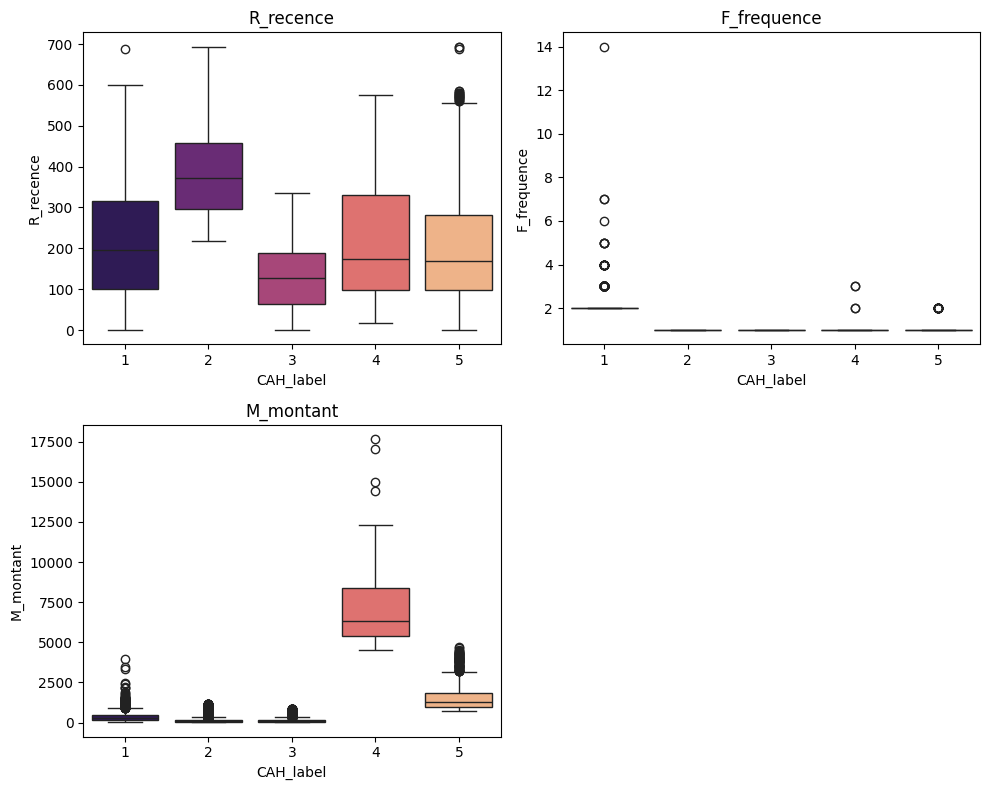

In [22]:
# Créer un boxplot pour chaque colonne
box_plot(df_RFM, échantillon, 'CAH_label') 

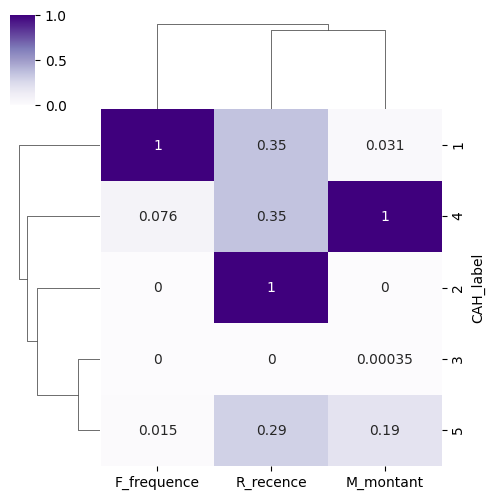

In [23]:
# Observons la répartitions de nos clusters avec une clustermap
sns.clustermap(centroïds_CAH_RFM, figsize=(5,5), annot=True, standard_scale=1, method='ward', cmap="Purples")

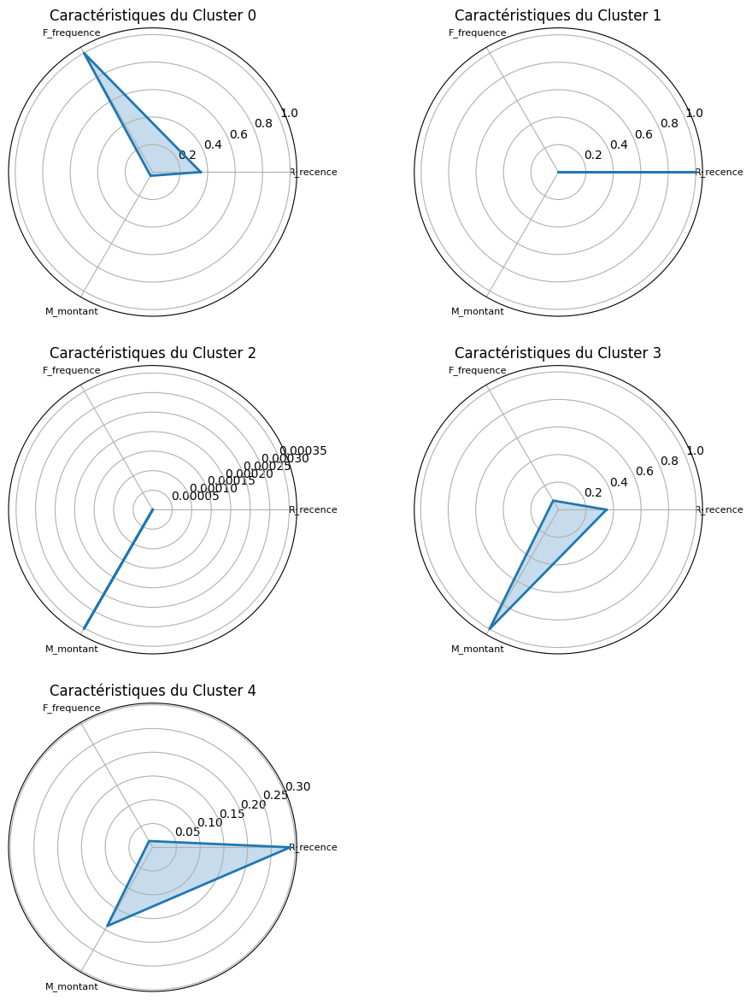

In [24]:
# Visualiser les clusters en radarplot
radar_plot(centroïds_CAH_RFM, df_RFM)

**Interprétation métier des clusters**
- Le **cluster 1** correspond aux *clients fidèles* ; ces clients ont commandé au moins 2 fois sur le site. 
- Le **cluster 2** correspond aux *clients perdus*. Ils ont commandé une seule fois pour un montant modéré il y a 377 jours en moyenne.
- Le **cluster 3** correspond aux derniers clients ayant commandé ; ils peuvent être assimilés à de *nouveaux clients* car c'était leur première commande. Il faut également noter que ces clients n'ont dépensé qu'un montant modéré.
- Le **cluster 4** correspond aux *clients ayant dépensé le plus sur le site* ; à noter que dans la majorité des cas ces clients n'ont commandé qu'une seule fois.
- Le **cluster 5** correspond aux *clients ayant dépensé une somme importante sur le site* ; mais, ces clients ont moins dépensé que le cluster 4, à noter que dans la majorité des cas ces clients n'ont commandé qu'une seule fois.

## 4. DBSCAN (Density-Based Spatial Clustering of Applications with Noise) avec les données RFM <a class="anchor" id="4"></a>

### 4.1 Recherche du nombre optimal de clusters <a class="anchor" id="4_1"></a>

In [25]:
# Calculer les silhouettes scores pour élir le meilleur couple epsilon et MinPts
df_resultats_DBSCAN = num_clusters_DBSCAN(df_normalized)
df_resultats_DBSCAN

,min_samples,eps,Silhouette,Davies_Bouldin,Type
10,5,1.0,0.734269,0.847784,DBSCAN
11,5,1.5,0.733813,1.046944,DBSCAN
7,4,1.0,0.733645,1.022659,DBSCAN
2,2,1.5,0.733483,1.075835,DBSCAN
8,4,1.5,0.733469,1.358878,DBSCAN
5,3,1.5,0.733355,1.340815,DBSCAN
1,2,1.0,0.733053,1.131369,DBSCAN
4,3,1.0,0.733000,1.341611,DBSCAN
9,5,0.5,0.492870,1.391978,DBSCAN
6,4,0.5,0.492571,1.458050,DBSCAN


Pour rechercher les meilleurs paramètres eps et min_samples, il faut maximiser le score Silhouette et minimiser l'indice de Davies-Bouldin.

### 4.2 Entraînement du DBSCAN <a class="anchor" id="4_2"></a>

In [26]:
# Choisir les paramètres epsilon et MinPts
eps = 1
min_samples = 5

# Instancier l'algorithme DBSCAN avec les paramètres choisis
dbscan= DBSCAN(eps=eps, min_samples=min_samples)

# Entraîner le modèle
dbscan.fit(df_normalized)

# Rajouter les labels des clusters au Dataframe
df_DBSCAN = df_RFM.copy()
df_DBSCAN['DBSCAN_label'] = dbscan.labels_
df_DBSCAN.head()

,R_recence,F_frequence,M_montant,DBSCAN_label
customer_unique_id,,,,
7c396fd4830fd04220f754e42b4e5bff,331,2,82.82,0
0f4389ffbcaa187a02a5ebeb0a2e616c,136,1,297.20,1
0f09cdca721fc27f3db141488a6ba143,35,1,80.31,1
0f687670823f779b76513fc03d33aab2,429,1,64.77,1
0036a074f98b80c4f1fc33dbbcf9c552,474,1,42.62,1


In [27]:
# Afficher le nombre de clients par clusters
df_count_DBSCAN = pd.DataFrame(df_DBSCAN['DBSCAN_label'].value_counts())
df_count_DBSCAN

,count
DBSCAN_label,
1,88502
0,2470
2,159
-1,64
3,21
4,9


Nous avons donc ici 6 clusters dont un '-1' qui correspond à l'isolation du bruit et donc aux outliers présents dans le DataSet.

### 4.3 Interprétation des clusters <a class="anchor" id="4_3"></a>

In [28]:
# Afficher les centroïdes pour commencer à interpréter les clusters
centroïds_DBSCAN_RFM = df_DBSCAN.groupby('DBSCAN_label').mean()
centroïds_DBSCAN_RFM

,R_recence,F_frequence,M_montant
DBSCAN_label,,,
-1,239.703125,2.65625,8176.647813
0,220.512955,2.00000,392.063287
1,236.677781,1.00000,197.104116
2,204.798742,3.00000,553.224025
3,117.285714,4.00000,781.433333
4,140.444444,5.00000,888.738889


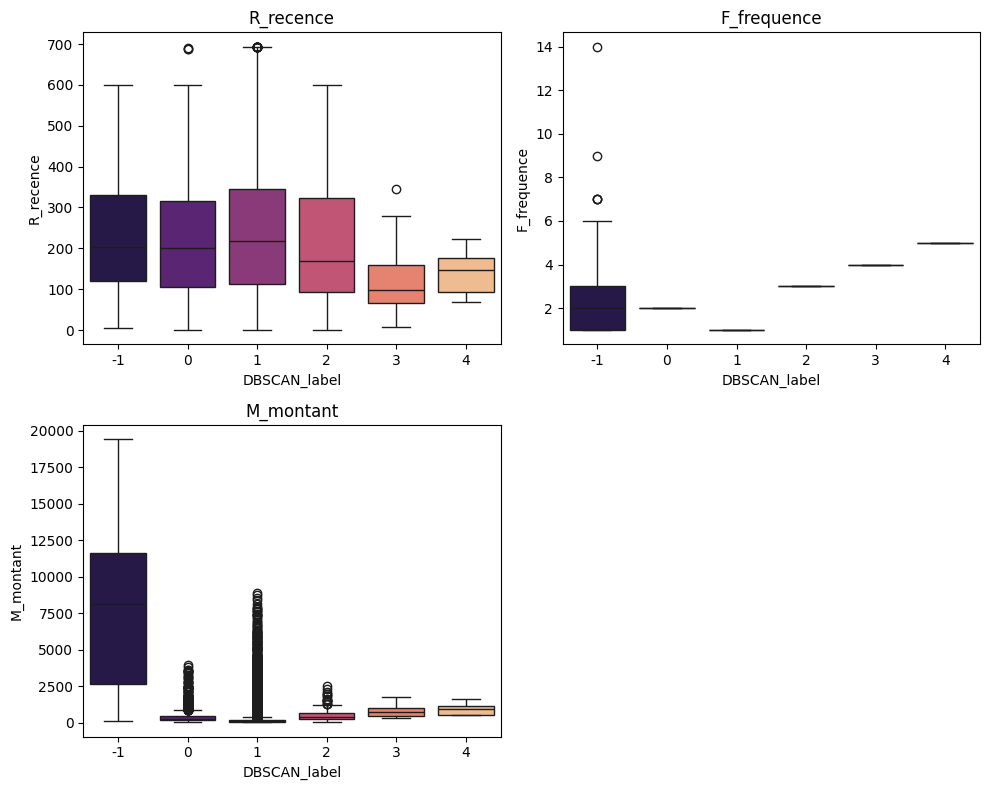

In [29]:
# Créer un boxplot pour chaque colonne
box_plot(df_RFM, df_DBSCAN, 'DBSCAN_label')

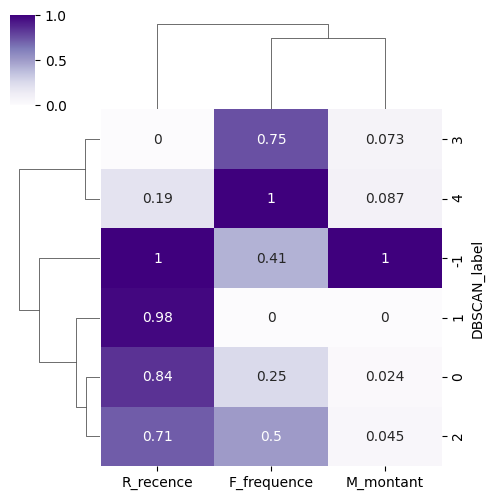

In [30]:
# Observons la répartitions de nos clusters avec une clustermap
sns.clustermap(centroïds_DBSCAN_RFM, figsize=(5,5), annot=True, standard_scale=1, method='ward', cmap="Purples")

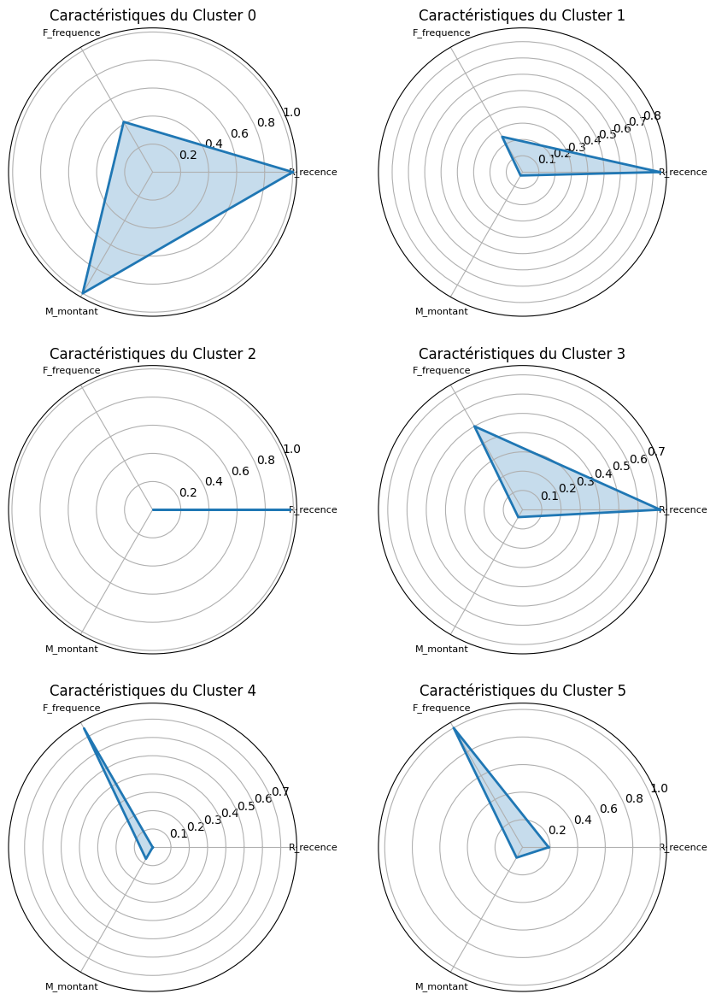

In [31]:
# Visualiser les clusters en radarplot
radar_plot(centroïds_DBSCAN_RFM, df_RFM)

Ici, le cluster -1 correspond aux clients atypiques, cependant, pour les autres clusters, l'interprétation devient compliquée car la seule distinction est faite par la fréquence d'achat : 
- Le **cluster 0** correspond aux *clients ayant commandé 2 fois*.
- Le **cluster 1** correspond aux *clients ayant commandé 1 fois*. 
- Le **cluster 2** correspond aux *clients ayant commandé 3 fois*.
- Le **cluster 3** correspond aux *clients ayant commandé 4 fois*.
- Le **cluster 4** correspond aux *clients ayant commandé 5 fois*.

Le DataSet étant constitué à 97% de clients ayant commandé 1 seule fois, cela déséquilibre nos clusters en plus d'avoir une interprétation très compliqué sur les variables de récences et de montant.

Le DBSCAN n'est pas exploitable dans notre cas.

In [32]:
# Garder les résultats optenus dans un Dataframe
new_row = df_resultats_DBSCAN.loc[(df_resultats_DBSCAN['min_samples'] == min_samples) & (df_resultats_DBSCAN['eps'] == eps)]

# Concaténer le nouveau DataFrame avec df_resultats
df_resultats = pd.concat([df_resultats, new_row], ignore_index=True)
df_resultats['n_clusters'].fillna(len(centroïds_DBSCAN_RFM.index), inplace=True)
df_resultats

,Type,n_clusters,Silhouette,Davies_Bouldin,min_samples,eps
0,KMeans,5.0,0.525578,0.620122,NaN,NaN
1,CAH,5.0,0.519143,0.632865,NaN,NaN
2,DBSCAN,6.0,0.734269,0.847784,5.0,1.0


Le choix du type de clustering pourrait se porter sur le KMeans. En éliminant le DBSCAN en raison de son interprétation moins pratique au niveau des clusters et en visant à maximiser le score de silhouette, et à minimiser le score de Davies-Bouldin, le KMeans se présente comme une option favorable.

Par ailleurs, le KMeans présente des avantages en termes de performance des ressources, notamment par rapport à une Classification Ascendante Hiérarchique (CAH), pour laquelle nous avons dû échantillonner le jeu de données des clients.

## 5. KMeans avec les données RFM + 'Mean_review_score' <a class="anchor" id="5"></a>

### 5.1 Recherche du nombre optimal de clusters <a class="anchor" id="5_1"></a>

In [33]:
# Normaliser les données
df_clustering_normalized = scaler.fit_transform(df_clustering)

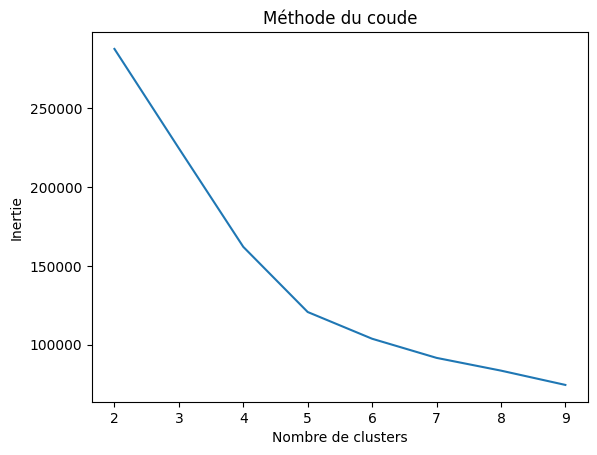

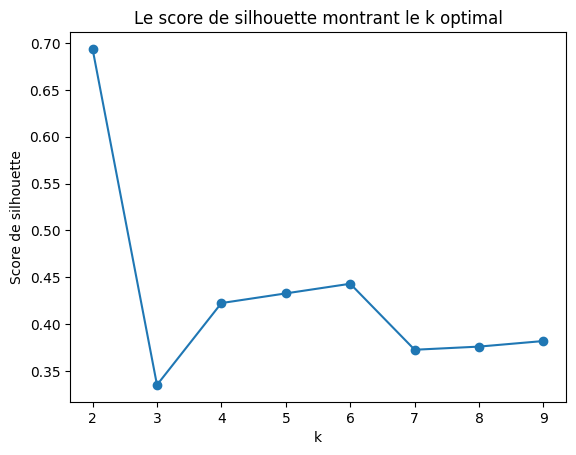

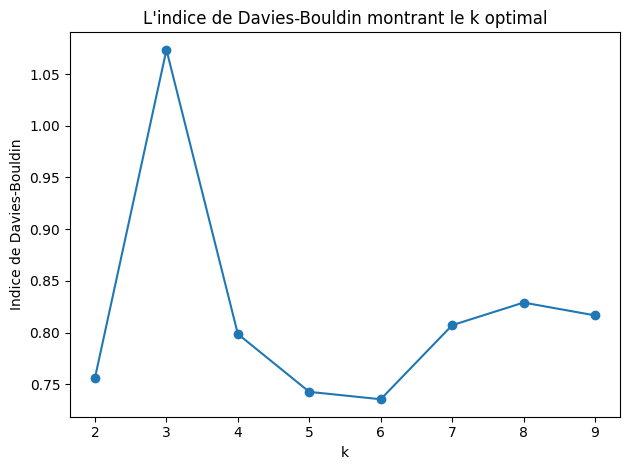

,Type,n_clusters,Silhouette,Davies_Bouldin
0,KMeans + ReviewScore,2,0.693680,0.756450
4,KMeans + ReviewScore,6,0.443026,0.735506
3,KMeans + ReviewScore,5,0.432726,0.742658
2,KMeans + ReviewScore,4,0.422399,0.798567
7,KMeans + ReviewScore,9,0.381889,0.816595
6,KMeans + ReviewScore,8,0.375937,0.828995
5,KMeans + ReviewScore,7,0.372566,0.807116
1,KMeans + ReviewScore,3,0.335027,1.073432


In [34]:
# Choix du nombre optimal de clusters (méthode du coude et du score de silhouette)
df_resultats_KMeans = num_clusters_kmeans(df_clustering_normalized)
df_resultats_KMeans['Type'] = 'KMeans + ReviewScore'
df_resultats_KMeans

En utilisant la méthode du coude, nous constatons que le nombre idéal de clusters est de 5. 
En se basant sur le score Silhouette et sur l'indice de Davies-Bouldin l'option de 6 clusters semble être la meilleure.

### 5.2 Entraînement du KMeans <a class="anchor" id="5_2"></a>

In [35]:
# Choix du nombre de clusters
k = 6

# Appliquer KMeans avec le nombre de clusters optimal trouvé
kmeans = KMeans(n_clusters=k, n_init=10, init='k-means++', random_state=42)
kmeans.fit(df_clustering_normalized)

KMeans(n_clusters=6, n_init=10, random_state=42)

In [36]:
# Attribuer les labels du KMeans aux clients
df_KMeans_review = df_clustering.copy()
df_KMeans_review['KMeans_label'] = kmeans.labels_
df_KMeans_review.head()

,R_recence,F_frequence,M_montant,Mean_review_score,KMeans_label
customer_unique_id,,,,,
7c396fd4830fd04220f754e42b4e5bff,331,2,82.82,4.25,0
0f4389ffbcaa187a02a5ebeb0a2e616c,136,1,297.20,4.00,1
0f09cdca721fc27f3db141488a6ba143,35,1,80.31,5.00,1
0f687670823f779b76513fc03d33aab2,429,1,64.77,5.00,2
0036a074f98b80c4f1fc33dbbcf9c552,474,1,42.62,5.00,2


In [37]:
# Garder les résultats optenus dans un Dataframe
new_row = df_resultats_KMeans.loc[df_resultats_KMeans['n_clusters'] == k]

# Concaténer le nouveau DataFrame avec df_resultats
df_resultats = pd.concat([df_resultats, new_row], ignore_index=True)
df_resultats

,Type,n_clusters,Silhouette,Davies_Bouldin,min_samples,eps
0,KMeans,5.0,0.525578,0.620122,NaN,NaN
1,CAH,5.0,0.519143,0.632865,NaN,NaN
2,DBSCAN,6.0,0.734269,0.847784,5.0,1.0
3,KMeans + ReviewScore,6.0,0.443026,0.735506,NaN,NaN


In [38]:
# Afficher le nombre de clients par clusters
df_count_KMeans_review = pd.DataFrame(df_KMeans_review['KMeans_label'].value_counts())
df_count_KMeans_review

,count
KMeans_label,
1,40787
2,30757
4,15327
0,2660
3,1585
5,109


### 5.3 Interprétation des clusters <a class="anchor" id="5_3"></a>

In [39]:
# Afficher les centroïdes pour commencer à interpréter les clusters
centroïds_Kmeans = df_KMeans_review.groupby('KMeans_label')[df_clustering.columns].mean()
centroïds_Kmeans

,R_recence,F_frequence,M_montant,Mean_review_score
KMeans_label,,,,
0,218.931579,2.110526,395.543838,4.213912
1,121.780518,1.000000,153.421338,4.707419
2,393.067042,1.000000,156.486934,4.640976
3,231.958360,1.013880,1927.407167,3.822889
4,229.131598,1.000000,192.700943,1.739186
5,222.183486,1.155963,8411.950367,3.176103


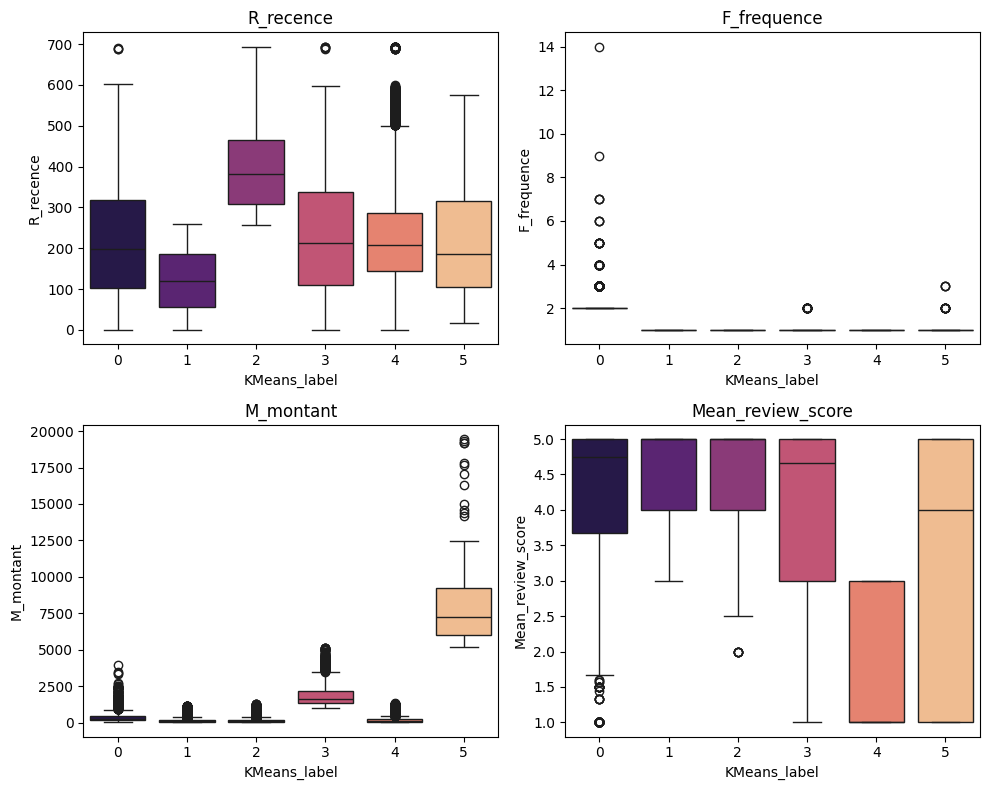

In [40]:
# Créer un boxplot pour chaque colonne
box_plot(df_clustering, df_KMeans_review, 'KMeans_label') 

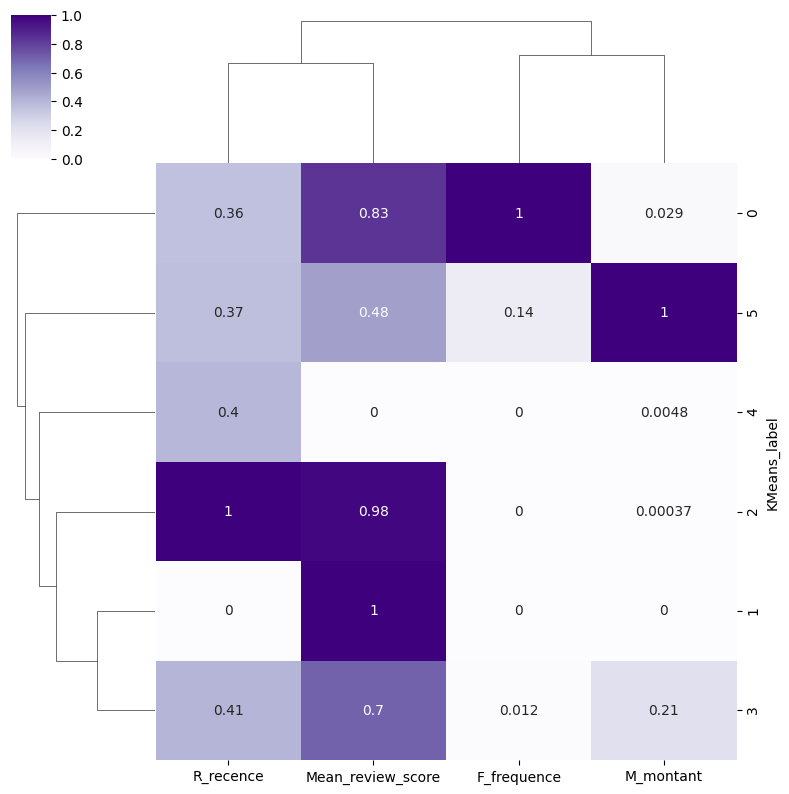

In [41]:
# Observons la répartitions de nos clusters avec une clustermap
sns.clustermap(centroïds_Kmeans, figsize=(8, 8), annot=True, standard_scale=1, method='ward', cmap="Purples")

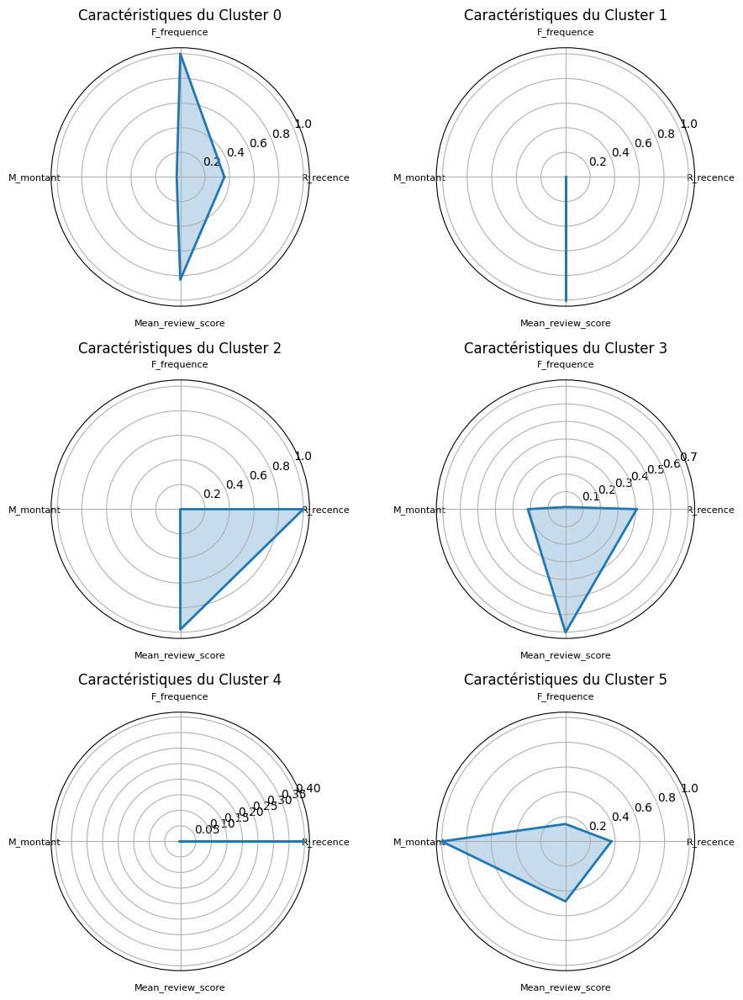

In [42]:
# Visualiser les clusters en radarplot
radar_plot(centroïds_Kmeans, df_clustering)

**Interprétation métier des clusters**
- Le **cluster 0** correspond aux *clients fidèles*, caractérisés par des achats fréquents, à noter que ces clients sont majoritairement satisfaits.
- Le **cluster 1** correspond aux *nouveaux clients*. Ils ont commandé une seule fois pour un montant modéré et ils sont satisfaits.
- Le **cluster 2** correspond aux *clients perdus*. Ils ont commandé une seule fois pour un montant modéré il y a 393 jours en moyenne. Ils étaient satisfait de leur expérience.
- Le **cluster 3** correspond aux *clients ayant dépensé une somme importante sur le site* ces clients sont majoritairement satisfaits.
- Le **cluster 4** correspond aux *clients non satisfaits*.
- Le **cluster 5** correspond aux *clients ayant dépensé le plus sur le site*, à noter que dans la majorité des cas ces clients n'ont commandé qu'une seule fois. La satisfaction n'est pas vraiment un critère ici, il va y avoir des clients satisfaits comme des clients non satisfaits. 

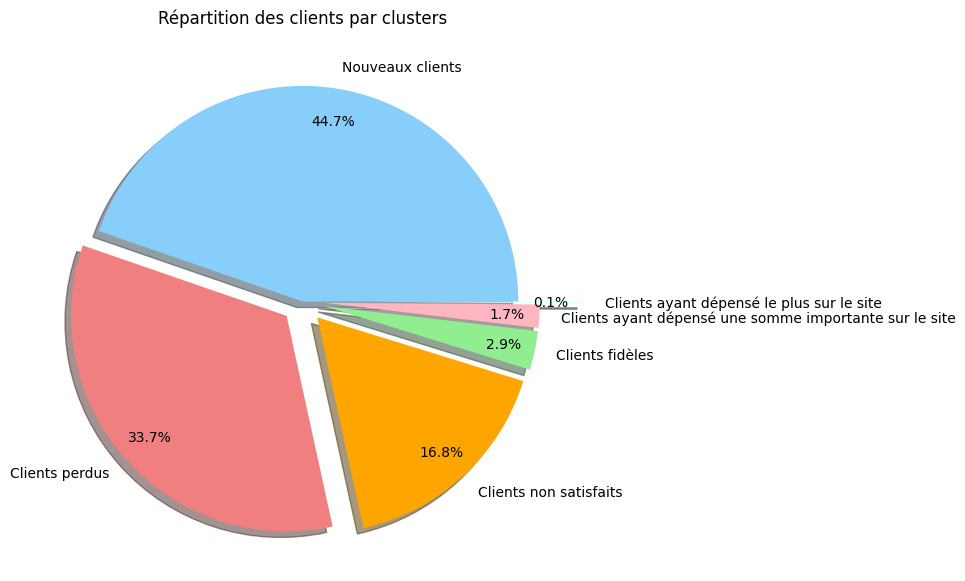

In [43]:
clusters_Kmeans = {
    0: 'Clients fidèles',
    1: 'Nouveaux clients',
    2: 'Clients perdus',
    3: 'Clients ayant dépensé une somme importante sur le site',
    4: 'Clients non satisfaits',
    5: 'Clients ayant dépensé le plus sur le site'
}

df_count_KMeans_review.index = df_count_KMeans_review.index.map(clusters_Kmeans)

plt.figure(figsize=(7,7))
colors = ['lightskyblue', 'lightcoral', 'orange', 'lightgreen', 'lightpink', 'lightcyan']
plt.pie(
    df_count_KMeans_review['count'],
    explode=(0, 0.1, 0.1, 0.1, 0.1, 0.3),
    labels=df_count_KMeans_review.index, 
    colors=colors,
    autopct='%1.1f%%', 
    pctdistance=0.85,
    shadow=True
)
plt.title('Répartition des clients par clusters')
plt.show()

## 6. Conclusion et choix de l'algorithme <a class="anchor" id="6"></a>

In [44]:
df_resultats.loc[(df_resultats['Type'] == 'KMeans') | (df_resultats['Type'] == 'KMeans + ReviewScore')]

,Type,n_clusters,Silhouette,Davies_Bouldin,min_samples,eps
0,KMeans,5.0,0.525578,0.620122,NaN,NaN
3,KMeans + ReviewScore,6.0,0.443026,0.735506,NaN,NaN


Bien que la dernière option, consistant à ajouter le score laissé en commentaire par les clients, n'ait pas maximisé le score de silhouette, ni minimiser l'indice de Davies-Bouldin, nous allons néanmoins la choisir. 

En effet, cette option offre une précision accrue en termes d'interprétation et nous permet d'obtenir un cluster supplémentaire qui facilite l'identification des clients mécontents. De plus, cela nous permet de connaître le niveau de satisfaction sur les autres clusters pour une meilleure interprétation métier. 